<a href="https://colab.research.google.com/github/LokiAndere/MIARFID-VPC-2019-20/blob/master/res_net_family.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**ResNet Family nets**

In [0]:
import keras
import keras.backend as BCKN
from keras.models import Model
from keras.layers import Input, Concatenate, Add, Dropout, Multiply
from keras.layers import concatenate, add
from keras.layers import Dense, Conv2D
from keras.layers import MaxPooling2D, AveragePooling2D, GlobalAveragePooling2D
from keras.layers import BatchNormalization as BN
from keras.layers import ReLU, Softmax
from keras.utils.vis_utils import plot_model

Using TensorFlow backend.


Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 1024, 1024, 3)     0         
_________________________________________________________________
batch_normalization_1 (Batch (None, 1024, 1024, 3)     12        
_________________________________________________________________
re_lu_1 (ReLU)               (None, 1024, 1024, 3)     0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 1024, 1024, 128)   512       
Total params: 524
Trainable params: 518
Non-trainable params: 6
_________________________________________________________________


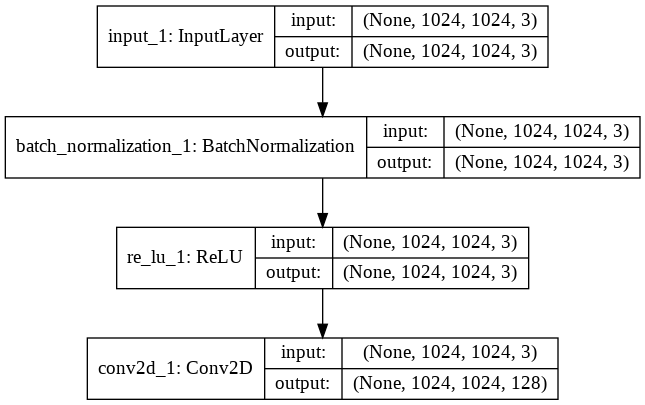

In [0]:
#at this stage we train to work in functional model
#and we train to show the results if plot form
shape = (1024, 1024, 3)
num_classes = 1000

def BNRC(model, filters, kernal, strdide=1):
  model = BN() (model)
  model = ReLU() (model)
  model = Conv2D(filters, kernal, strides=strdide, padding='same') (model)
  return model

BCKN.clear_session()
first = Input(shape)
inside = BNRC(first, 4*32, 1)
model = Model(first, inside)
model.summary()
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

**RESNET**

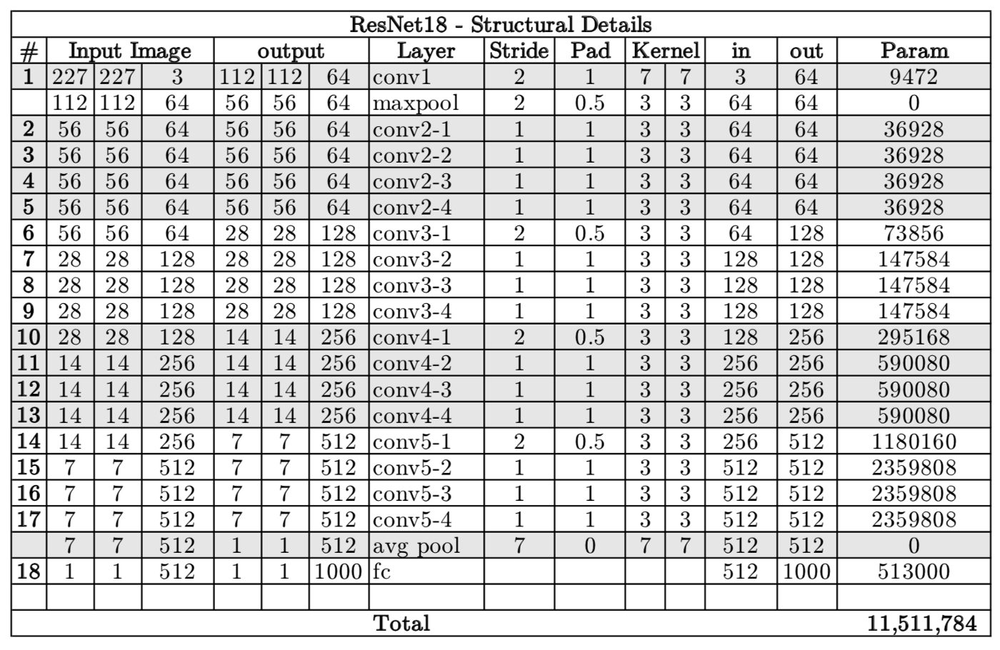

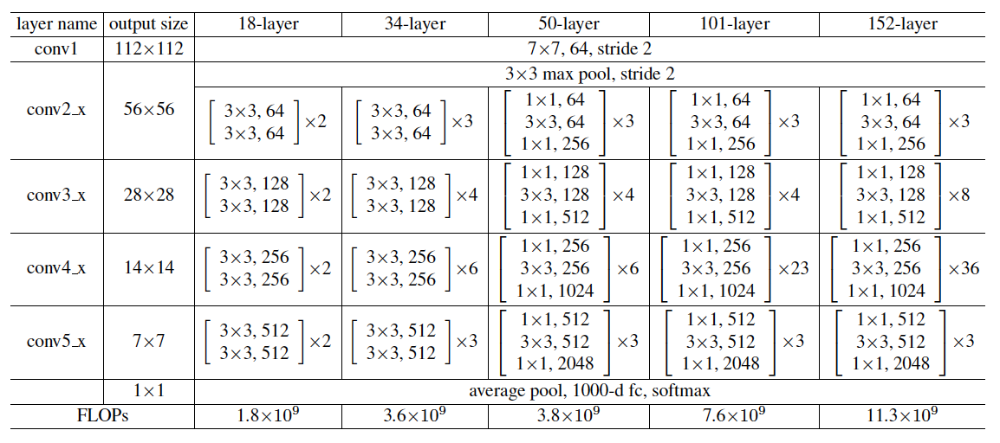

In our opinion those pictures are very self explanatory. And looking on them while implementing them as classes or functions in python would be a great idea for practical classes to have with students. Which is exactly what we indeed propose.

In [0]:
#During all the code in the end we use global average pulling
#because we do not want to think about the size of a picture,
#the dimentions on last step of topology
#just global and job is done

In [0]:
def ResNet(shape, num_classes, type='B', arch_list = (2, 2, 2, 2)):

  #B||B
  #2,2,2,2||3,4,6,3

  #BN||BN
  #3,4,6,3||3,8,36,3 

  #it was not necesary to implement it
  #but we wanted to try, and as we were taught
  #"this is a gift to you"

  #from the programmer's point of view it seems like a good idea
  #to write two different functions for basic and bottle neck block resnet
  #it would be cleaner, simpler, easier to implement and to read
  #but for the sake of this practice and paper read
  #it is to be in one function
  #in such case
  #every single different block is coded in separate function
  #for example: when constructing a block with or without relu at the end
  #there are no more "if"s, separate functions insead

  #we begin building
  first = Input(shape)
  model = Conv2D(64, 7, strides=2, padding='same') (first)
  #paper suggests usage of batch normalization
  #after every convolution block and before activation
  model = BN() (model)
  model = ReLU() (model)
  model = MaxPooling2D(3, strides=2, padding='same') (model)
  #we have this weird structure because we go line by line
  #according to table in paper, the table can be seen here above
  #who we? me and Ferdinand the second of Aragon with his sward and honor
  #so as we see above at this point we created and passed conv1
  #and we transit from conv1 to conv2_x and at this point we need functions
  #lots of functions
  #they are defined in order of usage

  #smallest building block which rises a question
  #to put relu or put not relu
  def CBNR (model, filters, kernal, put_relu='NR', strdide=1):
    model = Conv2D(filters, kernal, strides=strdide, padding='same') (model)
    model = BN() (model)
    if put_relu.upper() == 'R':
      model = ReLU() (model)
    return model

  #the first part of functions is for basic resnet

  #identity block, straight line
  #basic
  def IBS (model, filters):
    streight = CBNR(model, filters, 3, 'R')
    streight = CBNR(streight, filters, 3, 'NR')
    model = Add () ([streight, model])
    model = ReLU() (model)
    return model

  #convolution block, dotty line
  #downsampling is performed by conv3_1, conv4_1, and conv5_1
  #with a stride of 2, so we need a stride argument
  #basic
  def CBS (model, filters, stride):
    streight = CBNR(model, filters, 3, 'R', stride)
    streight = CBNR(streight, filters, 3, 'NR')
    model = CBNR(model, filters, 1, 'NR', stride)
    model = Add () ([streight, model])
    model = ReLU() (model)
    return model

  #further in this code segment we do not delete the streight foreward code
  #so that a reader could understand what has been done
  #it is a part of our class proposal
  #as we see it one can learn how to implement those
  #line by line looking at tablesvof net structure
  #and then can be challenged to put affort in some automation of the process

  #identity block, straight line
  #bottle neck
  def IBBN (model, filters):
    #streight = Conv2D(filters, 1) (model)
    #streight = BN() (streight)
    #streight = ReLU() (streight)
    #streight = Conv2D(filters, 3, padding='same') (streight)
    #streight = BN() (streight)
    #streight = ReLU() (streight)
    streight = CBNR(model, filters, 1, 'R')
    streight = CBNR(streight, filters, 3, 'R')
    #streight = Conv2D(4*filters, 1) (streight)
    #streight = BN() (streight)
    streight = CBNR(streight, 4*filters, 1, 'NR')
    model = Add () ([streight, model])
    model = ReLU() (model)
    return model

  #this part of functions are for bottle neck resnet

  #convolution block, dotty line
  #downsampling is performed by conv3_1, conv4_1, and conv5_1
  #with a stride of 2, so we need a stride argument
  #bottle neck
  def CBBN (model, filters, stride):
    #streight = Conv2D(filters, 1) (model)
    #streight = BN() (streight)
    #streight = ReLU() (streight)
    #streight = Conv2D(filters, 3, strides=stride, padding='same') (streight)
    #streight = BN() (streight)
    #streight = ReLU() (streight)
    streight = CBNR(model, filters, 1, 'R')
    streight = CBNR(streight, filters, 3, 'R', stride)
    #streight = Conv2D(4*filters, 1) (streight)
    #streight = BN() (streight)
    streight = CBNR(streight, 4*filters, 1, 'NR')
    #model = Conv2D(4*filters, 1, strides=stride) (model)
    #model = BN() (model)
    model = CBNR(model, 4*filters, 1, 'NR', stride)
    model = Add () ([streight, model])
    model = ReLU() (model)
    return model
  
  #superposition block
  #or resnet block
  #block of blocks
  def RB (model, filters, stride, repeat):
    #one dotty line block
    #repeat minus one streight lines block
    #downsampling is performed by conv3_1, conv4_1, and conv5_1
    #not in conv2_1, in conv2_x stride is not changing
    #that is why we need strige argument
    if type.upper()=='BN':
      model = CBBN (model, filters, stride)
    elif type.upper()=='B':
      model = CBS (model, filters, stride)
    for _ in range(repeat - 1):
      if type.upper()=='BN':
        model = IBBN(model, filters)
      elif type.upper()=='B':
        model = IBS(model, filters)
    return model

  #functions are done
  #also the number of filters is fixed due to model structure
  #which is given in paper
  filters = (64, 128, 256, 512)
  flag = True
  for filter, repeat in zip(filters, arch_list):
    #we don't have downsampling yet
    #this is conv2_x with stride 1
    if flag:
      model = RB(model, filter, 1, repeat)
      flag = False
    else:
      model = RB(model, filter, 2, repeat)

  #we changed average pooling to global average pooling to get 1x1 result
  model = GlobalAveragePooling2D() (model)
  model = Dense(num_classes) (model)
  last = Softmax() (model)
  final = Model(first, last)

  return final

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 224, 224, 3)  0                                            
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 112, 112, 64) 9472        input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization_1 (BatchNor (None, 112, 112, 64) 256         conv2d_1[0][0]                   
__________________________________________________________________________________________________
re_lu_1 (ReLU)                  (None, 112, 112, 64) 0           batch_normalization_1[0][0]      
____________________________________________________________________________________________

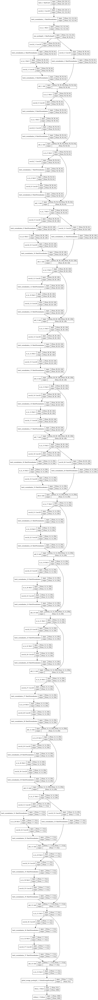

In [0]:
shape = (224, 224, 3)
num_classes = 1000
architecture = (3, 4, 6, 3)
type = 'B'
BCKN.clear_session()
model = ResNet(shape, num_classes, type, architecture)
model.summary()
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

In [0]:
shape = (224, 224, 3)
num_classes = 1000
architecture = (3, 8, 36, 3)
type = 'BN'
BCKN.clear_session()
model = ResNet(shape, num_classes, type, architecture)
model.summary()
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 224, 224, 3)  0                                            
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 112, 112, 64) 9472        input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization_1 (BatchNor (None, 112, 112, 64) 256         conv2d_1[0][0]                   
__________________________________________________________________________________________________
re_lu_1 (ReLU)                  (None, 112, 112, 64) 0           batch_normalization_1[0][0]      
____________________________________________________________________________________________

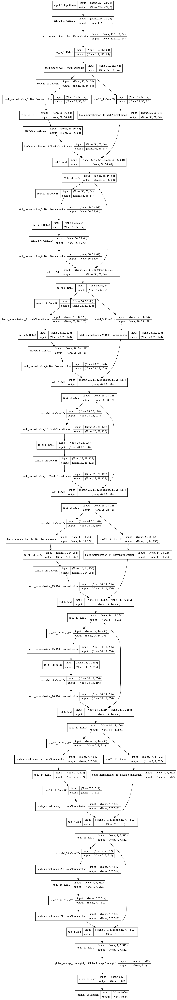

In [0]:
shape = (224, 224, 3)
num_classes = 1000
BCKN.clear_session()
model = ResNet(shape, num_classes)
model.summary()
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

**WISENET**

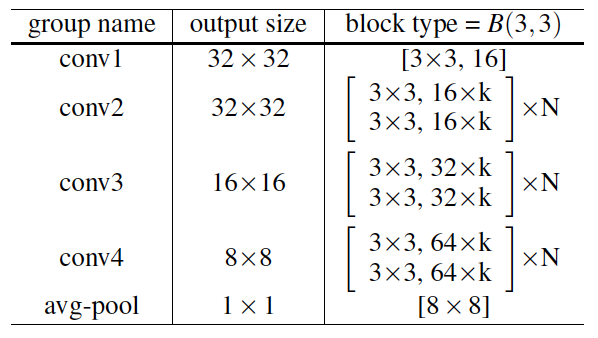

OK, clearly I am bad at adding images
thus do not blame Ferdinand

In [0]:
def WiseNet(shape, num_classes, k=1, N=2, d=0):

  #we did not implement D or B parameters from the paper
  #but were preparing for that
  #do not confuse our dropout coeficient d
  #with number of repeticions D
  #B is convolution block structure, the B=(3,3,0) was coded

  #relu batch normalization convolution block
  def BNRC(model, filters, kernal, stride=1):
    model = BN()(model)
    model = ReLU()(model)
    model = Conv2D(filters, kernal, strides=stride, padding='same')(model)
    return model

  first = Input(shape)
  model = BNRC(first, 16, 3)
  model = BN() (model)
  model = ReLU() (model)
  model = MaxPooling2D(3, strides=1, padding='same') (model)

  #identity block, straight line
  #basic wide dropout
  #or wide dropout
  def IBWB(model, filters, d):
    streight = BNRC(model,filters, 3)
    if d:
      streight = Dropout(d) (streight)
    streight = BNRC(streight,filters, 3)
    model = Add()([streight, model])
    model = ReLU()(model)
    return model

  #convolution block, dotty line
  #basic wide dropout
  #or wide dropout
  def CBWB(model, filters, d, stride):
    streight = BNRC(model,filters, 3)
    if d:
      streight = Dropout(d) (streight)
    streight = BNRC(streight,filters, 3, stride)
    model = BNRC(model,filters, 3, stride)
    model = Add()([streight, model])
    model = ReLU()(model)
    return model

  #wisenet block
  def WB (model, filters, repeat=N, d=0, stride=2):
    #one downsampling layer
    #repeat minus one slayers without downsampling
    #downsampling is performed by conv3_1, conv4_1
    #not in conv1_1 or conv2_1, there stride is not changing
    #that is why we need strige argument
    model = CBWB(model, k*filters, d, stride)
    for _ in range(repeat-1):
      model = IBWB(model, k*filters, d)
    return model

  #functions are done
  #also the number of filters is fixed due to model structure
  #which is given in paper
  filters = (16, 32, 64)
  flag = True
  for filter in filters:
    #we don't have downsampling yet
    #this is conv2_x with stride 1
    if flag:
      model = WB(model, filter, N, d, 1)
      flag = False
    else:
      model = WB(model, filter, N, d)

  #we changed average pooling to global average pooling to get 1x1 result
  model = GlobalAveragePooling2D() (model)
  model = Dense(num_classes) (model)
  last = Softmax() (model)
  final = Model(first, last)

  return final

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 32, 32, 3)    0                                            
__________________________________________________________________________________________________
batch_normalization_1 (BatchNor (None, 32, 32, 3)    12          input_1[0][0]                    
__________________________________________________________________________________________________
re_lu_1 (ReLU)                  (None, 32, 32, 3)    0           batch_normalization_1[0][0]      
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 32, 32, 16)   448         re_lu_1[0][0]                    
____________________________________________________________________________________________

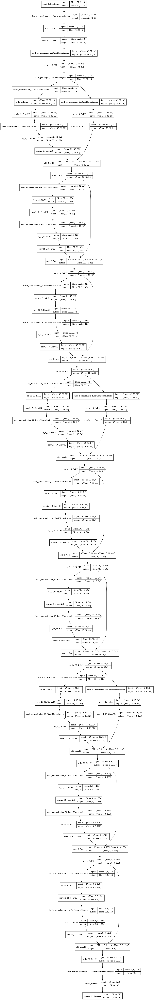

In [0]:
shape = (32, 32, 3)
num_classes = 10
k=2
n=3
BCKN.clear_session()
model = WiseNet(shape, num_classes, k, n)
model.summary()
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 32, 32, 3)    0                                            
__________________________________________________________________________________________________
batch_normalization_1 (BatchNor (None, 32, 32, 3)    12          input_1[0][0]                    
__________________________________________________________________________________________________
re_lu_1 (ReLU)                  (None, 32, 32, 3)    0           batch_normalization_1[0][0]      
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 32, 32, 16)   448         re_lu_1[0][0]                    
____________________________________________________________________________________________

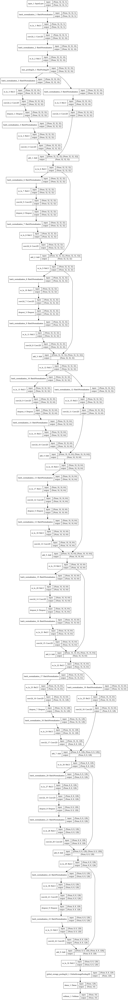

In [0]:
shape = (32, 32, 3)
num_classes = 10
k=2
n=3
d=0.5
BCKN.clear_session()
model = WiseNet(shape, num_classes, k, n, d)
model.summary()
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

**DENSENET**

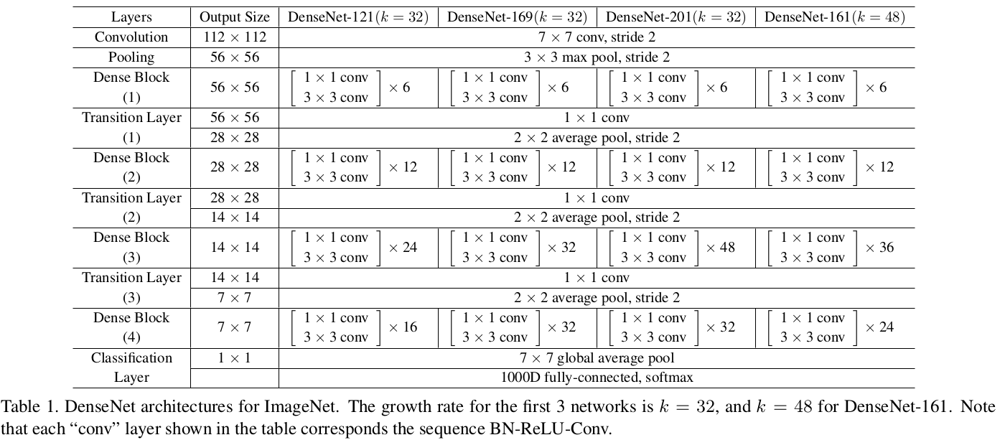

In [0]:
def DenseResNet(shape, num_classes, k=32, arch_list = (6, 12, 24, 16)):

#arch_list = (6, 12, 24, 16)||(6, 12, 32, 32)||(6, 12, 48, 32)||(6, 12, 36, 24)
#k=32||32||32||48

  first = Input(shape)
  model = Conv2D(64, 7, strides=2, padding='same') (first)
  model = MaxPooling2D(3, strides=2, padding='same') (model)

  #batch normalization, relu, convolution
  def BNRC(model, filters, kernal, strdide=1):
    model = BN() (model)
    model = ReLU() (model)
    model = Conv2D(filters, kernal, strides=strdide, padding='same') (model)
    return model

  #dense block, according to paper's terminology
  #we use bnrc on input and the result becomes additional deapth
  #with original input, creating input for next loop cycle
  def DB(model, repeat):
    for _ in range(repeat):
      inside = BNRC(model, 4*k, 1)
      inside = BNRC(inside, k, 3)
      model = Concatenate()([model, inside])
    return model

  #transition layer, again paper's terminology
  def TL(model):
    tupl = BCKN.int_shape(model)
    l = tupl[len(tupl)-1] // 2
    model = BNRC(model, l, 1)
    model = AveragePooling2D(2, strides=2, padding='same') (model)
    return model

  for repeat in arch_list:
    #we save the save tensor for last exit of our model structure
    #we do not need it during repetative construction
    #only on last step
    save = DB(model, repeat)
    model = TL(save)

  model = GlobalAveragePooling2D() (save)
  model = Dense(num_classes) (model)
  last = Softmax() (model)
  final = Model(first, last)

  return final

In [0]:
#the main problem with this family of nets is that it is hard
#to keep a track on number of parameters
#and at the end it sometimes differs from the given in papers

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 224, 224, 3)  0                                            
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 112, 112, 64) 9472        input_1[0][0]                    
__________________________________________________________________________________________________
max_pooling2d_1 (MaxPooling2D)  (None, 56, 56, 64)   0           conv2d_1[0][0]                   
__________________________________________________________________________________________________
batch_normalization_1 (BatchNor (None, 56, 56, 64)   256         max_pooling2d_1[0][0]            
____________________________________________________________________________________________

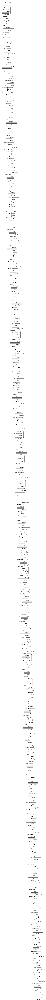

In [0]:
shape = (224, 224, 3)
num_classes = 1000
k=48
architecture = (6, 12, 36, 24)
BCKN.clear_session()
model = DenseResNet(shape, num_classes, k, architecture)
model.summary()
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)